# Image Processing Operations

## 1. Blending and Pasting images

In [1]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
img1=cv2.imread('dog_backpack.jpg')
img1=cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)

img2=cv2.imread('watermark_no_copy.png')
img2=cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)

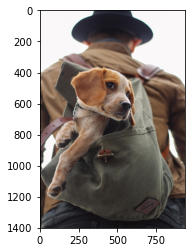

In [3]:
plt.imshow(img1)

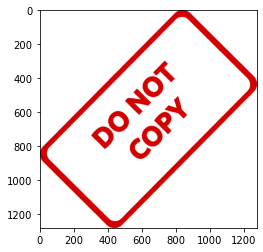

In [4]:
plt.imshow(img2)

In [5]:
img1.shape

(1401, 934, 3)

In [6]:
img2.shape

(1280, 1277, 3)

**(a) Blending images which are of same size**

In [7]:
#Resizing images
img1=cv2.resize(img1,(1200,1200))
img2=cv2.resize(img2,(1200,1200))

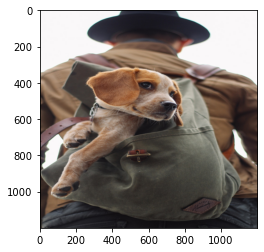

In [8]:
plt.imshow(img1)

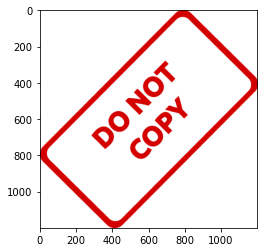

In [9]:
plt.imshow(img2)

In [10]:
#Blending images (alpha is for img1, beta is for img2)
#For img1 to shine more,make alpha higher and lower the beta value, as it is related to img2

blended = cv2.addWeighted(src1=img1,alpha=0.7,src2=img2,beta=0.1,gamma=0)

#"add_weighted" only works when images are of same size
#Blending images is done through the "addWeighted" function that uses both images and combines them

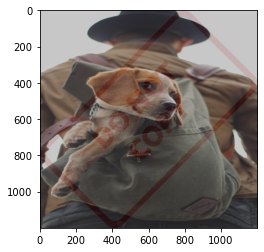

In [11]:
plt.imshow(blended)

In [12]:
#Overlay small image on top of a larger image(No blending)
#It is done using Numpy reassignment

In [13]:
img1=cv2.imread('dog_backpack.jpg')
img1=cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)

img2=cv2.imread('watermark_no_copy.png')
img2=cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)

In [14]:
img2=cv2.resize(img2,(600,600))

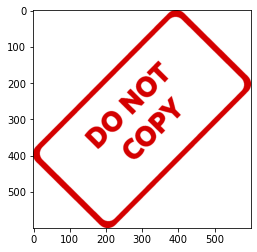

In [15]:
plt.imshow(img2)

In [16]:
large_img=img1
small_img=img2

In [17]:
#The top left corner where you want to insert that image
x_offset=0
y_offset=0

In [18]:
small_img.shape

(600, 600, 3)

In [19]:
#The bottom right corner where you want to end that image
x_end=x_offset + small_img.shape[1]    #Width
y_end=y_offset + small_img.shape[0]    #Height

In [20]:
large_img[y_offset:y_end,x_offset:x_end]=small_img
#numpy thinks the columns as x axis, and y values are numpy rows

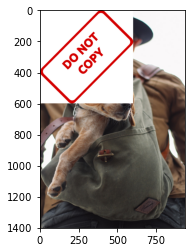

In [21]:
plt.imshow(large_img)

**Blendiing images which are of different sizes**

In [22]:
img1=cv2.imread('dog_backpack.jpg')
img1=cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)

img2=cv2.imread('watermark_no_copy.png')
img2=cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)

In [23]:
#Resizing the image
img2=cv2.resize(img2,(600,600))

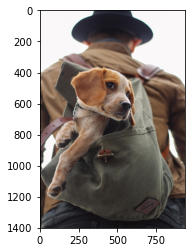

In [24]:
plt.imshow(img1)

**Region of Interest**--It is the area where we want to blend the image, we need to make the space of smaller image dimension

In [25]:
img1.shape

(1401, 934, 3)

In [26]:
#Grabbing an area of 60*600 from the larger image
x_offset=934-600 #Taking the last pixel from x axis and minus 600 from it so that we can put the image
y_offset=1401-600
x_offset,y_offset

(334, 801)

In [27]:
img2.shape

(600, 600, 3)

In [28]:
rows,cols,channels=img2.shape

In [29]:
roi=img1[y_offset:1401,x_offset:934] #Making shape to 600,600,3 

In [30]:
roi.shape

(600, 600, 3)

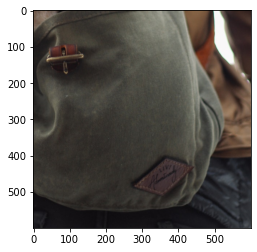

In [31]:
plt.imshow(roi)

**Mask**- It allows to only copy the front portion of the image, not the background one, like in "watermark image", we just want that red color logo.

In [32]:
img2gray=cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)

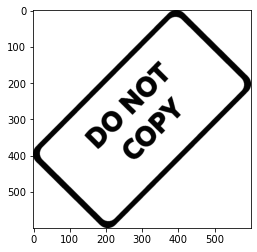

In [33]:
plt.imshow(img2gray,cmap='gray')

In [34]:
mask_inv=cv2.bitwise_not(img2gray) #bitwise helps in inverting, everything which is black will be white and vice versa

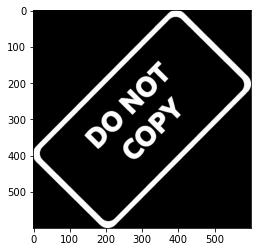

In [35]:
plt.imshow(mask_inv,cmap='gray')

In [36]:
mask_inv.shape

(600, 600)

Now as there is no color channel here, we need to make it compatible with the large image.To do that we will be using `np.full()` function which helps in converting to the desired shape with the fill_value

In [37]:
import numpy as np

In [38]:
#Creating a white background
white_background=np.full(img2.shape,255,dtype=np.uint8)

In [39]:
white_background

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

In [40]:
white_background.shape #now this matrix has 255 in it, leading to white background

(600, 600, 3)

In [41]:
bk=cv2.bitwise_or(white_background,white_background,mask=mask_inv)

In [42]:
bk.shape

(600, 600, 3)

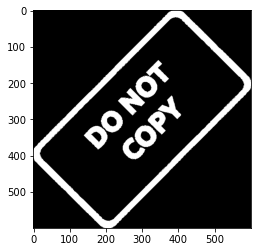

In [43]:
#Image is same across all 3 color channels
plt.imshow(bk) #Now this image is across all 3 color channels, now we will put the "watermark" iamge on top of it

In [44]:
#We have img2, we want that image to mask on top of this
fg=cv2.bitwise_or(img2,img2,mask=mask_inv)

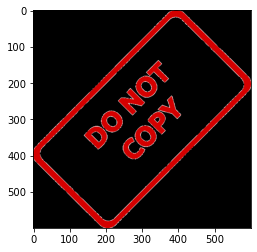

In [45]:
plt.imshow(fg)

In [46]:
#Putting roi image on fg image
final_roi = cv2.bitwise_or(roi,fg)

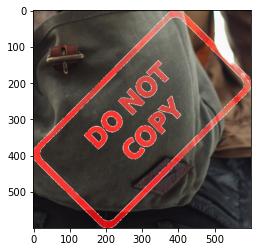

In [47]:
plt.imshow(final_roi)

In [48]:
#Now this portion of image will be overlayed on large image
large_img=img1
small_img=final_roi

In [49]:
large_img[y_offset:y_offset+small_img.shape[0],x_offset:x_offset+small_img.shape[1]]= small_img

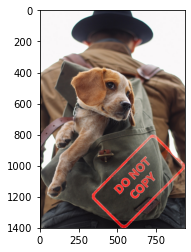

In [50]:
plt.imshow(large_img)

**Remember** - For blending and putting watermark on image of work we can always go to software like Photoshop and do such things

# 2. Image Thresholding

* Thresholding is a fundamental a very simple method of segmenting an image into different parts.
* Thresholding will convert an image to consist of only two values, white or black
* Here we first convert the image to grayscale and then provide threshold on image leading to only black and white

In [51]:
img=cv2.imread('rainbow.jpg')

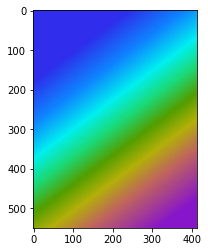

In [52]:
plt.imshow(img)

In [53]:
img=cv2.imread('rainbow.jpg',0) #Applying parameter 0 when reading the file leads to file converted to grayscale

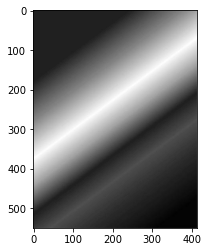

In [54]:
plt.imshow(img,cmap='gray')

In [55]:
#Applying threshold
#"thresh" parameter says that above this number all will be 255 and below it all will be 0.
#We are taking thresh value as 255/2
ret,thresh1=cv2.threshold(src=img,thresh=127,maxval=255,type=cv2.THRESH_BINARY)

#We have different type of Thresh, here we are using Threash Binary

In [56]:
ret

127.0

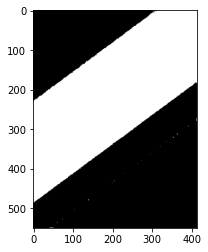

In [57]:
plt.imshow(thresh1,cmap='gray')

In [58]:
#Now doing it on a good image
img=cv2.imread('crossword.jpg',0)

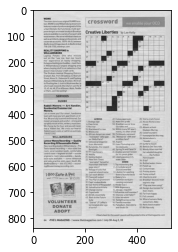

In [59]:
plt.imshow(img,cmap='gray')

In [60]:
def show_pic(img):
    fig=plt.figure(figsize=(15,15))
    ax=fig.add_subplot(111)
    ax.imshow(img,cmap='gray')

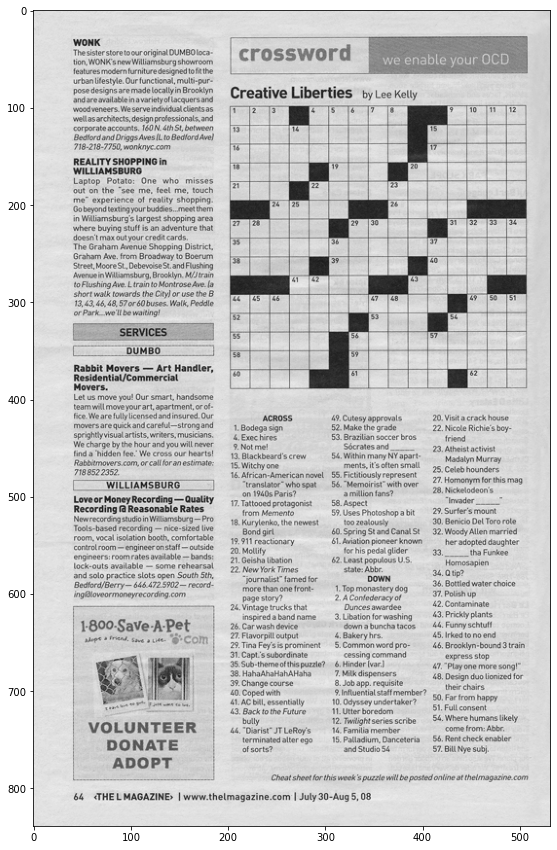

In [61]:
show_pic(img)

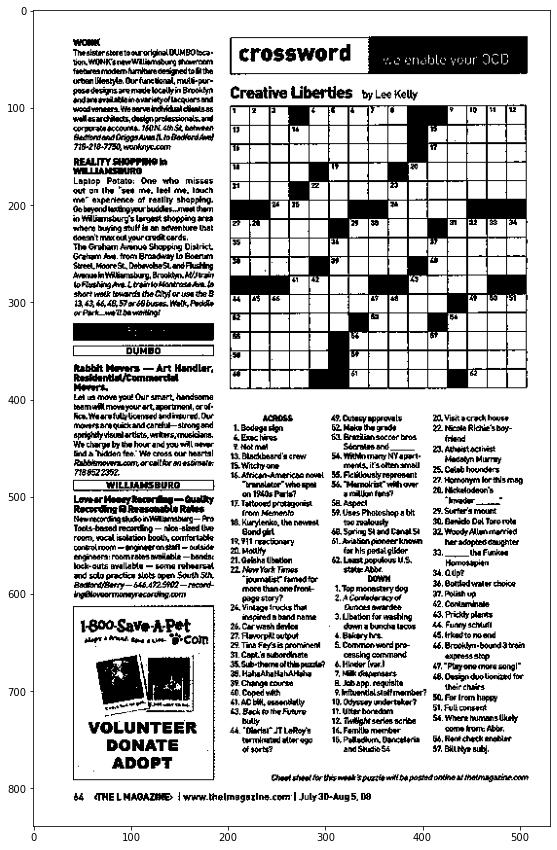

In [62]:
#We perform Threshold binary, but not able to do good job
ret,th1= cv2.threshold(img,190,255,cv2.THRESH_BINARY)
show_pic(th1)

We can play around with the parameters passing it different `thresh` value and `maxvalue`, but there is a method of **adpative thresholding.** In this also we need to try and experiment different parameters

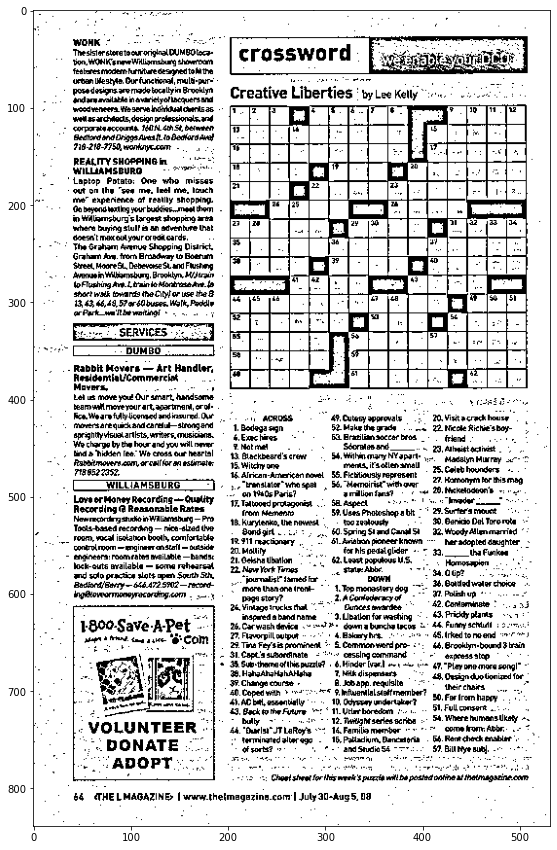

In [63]:
th2=cv2.adaptiveThreshold(img,
                          maxValue=255,
                          adaptiveMethod=cv2.ADAPTIVE_THRESH_MEAN_C,
                          thresholdType=cv2.THRESH_BINARY,
                          blockSize=11,  #It takes the odd number
                          C=8)

#Blocksize is the size of the pixel nieghbourhood that is used to calculate a threshold for a particular pixel.
#Adaptive threshold looks at neighbourhood pixel around a pixel and sees whether or not pixels next to it should be included or not


show_pic(th2)                 

## 3. Blurring and Smoothing

Smoothing an image can help get rid of noise or help an application focus on general details

Methods we will be exploring:-
* **Gamma Correction** - It can be applied to an image to make it appear brighter or darker depending on the Gamma value chosen
* **Kernel Based Filters** - Kernels can be applied over an image to produce a variety of effects. Kernel is just a matrix with predefined values of Blur, Smoothen, Sharpen etc. Takes 3*3 image kernel and 3*3 image pixel and multiply with them and sum them up and i.e. new output value
https://setosa.io/ev/image-kernels/

We need Blurring with Edge detection as Edge detection algorithms too many edges when shown a high resolution image without any blurring. If we use blurring, then edges are found good



In [64]:
#Loading image
def load_img():
    img = cv2.imread('bricks.jpg').astype(np.float32) / 255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [65]:
#Displaying image
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

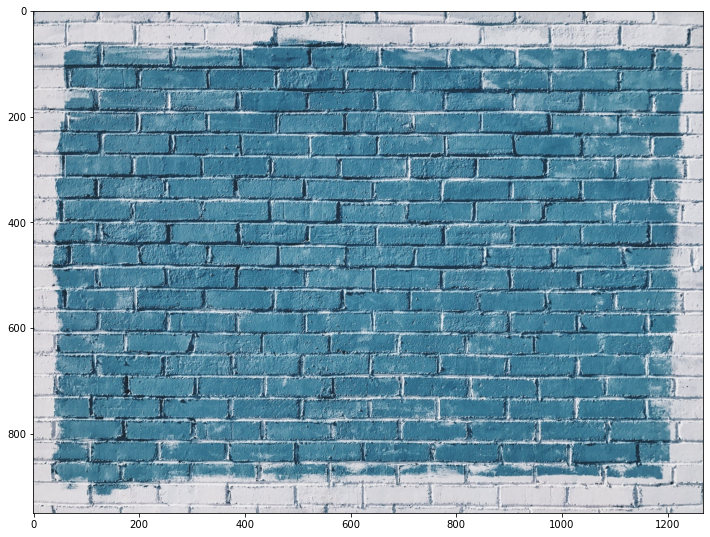

In [66]:
i = load_img()
display_img(i)

### 1. Gamma Correction

#### Increase Brightness

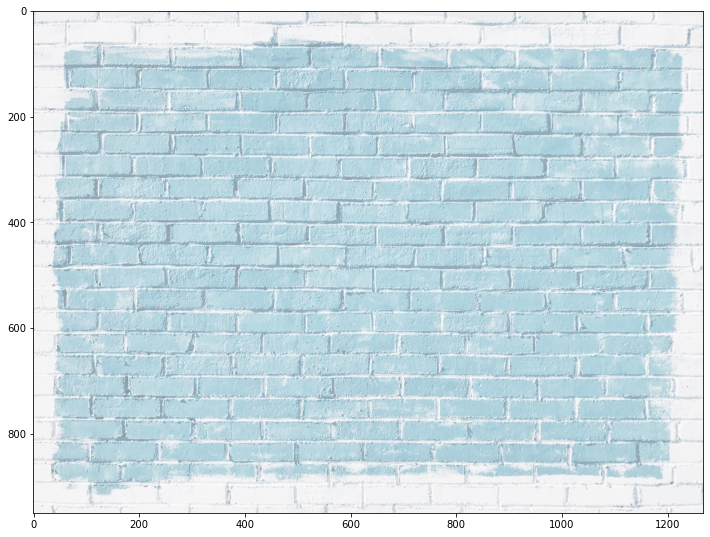

In [67]:
img = load_img()
#Lower the gamma value, brighter it will be
gamma = 1/4
#Every image pixel to the power of gamma
effected_image = np.power(img, gamma)
display_img(effected_image)

#### Decreasing Brightness

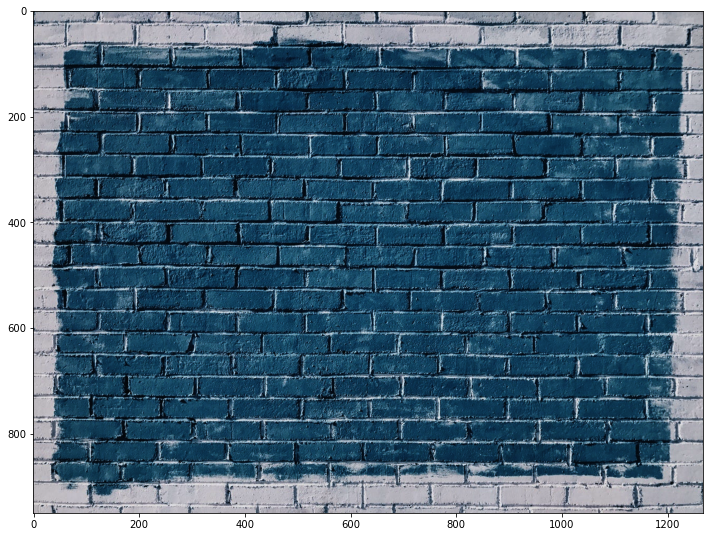

In [68]:
img = load_img()
#More the value of gamma, the darker the image will be
gamma = 2
#Every image pixel to the power of gamma
effected_image = np.power(img, gamma)
display_img(effected_image)

### 2. Low Pass Filter with a 2D Convolution

The process used to apply filters to an image is known as convolution, and may be applied in either the spatial or frequency domain

A fitlering operation known as 2D convolution can be used to create a low-pass filter.

A low pass filter is the basis for most smoothing methods. An image is smoothed by decreasing the disparity between pixel values by averaging nearby pixels.
Using a low pass filter tends to retain the low frequency information within an image while reducing the high frequency information. 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


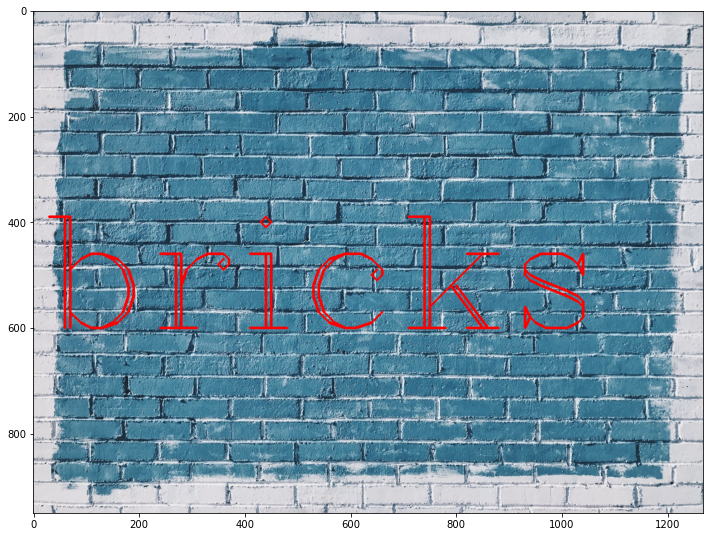

In [69]:
img = load_img()
#Setting the font from the predefined font of cv2
font = cv2.FONT_HERSHEY_COMPLEX
#Putting the text over the image with postion,font,font_scale,color
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img)

#### Create the Kernel

In [70]:
#Creating 5 by 5 kernel with total onees divided by 25
kernel = np.ones(shape=(5,5),dtype=np.float32)/25

In [71]:
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

In [72]:
1/25

0.04

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


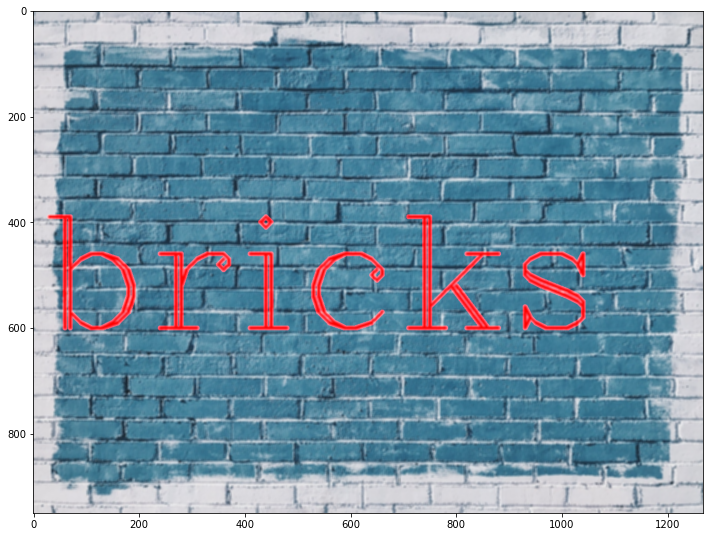

In [73]:
# -1 is the desired depth (output depth to be same as input depth)
dst = cv2.filter2D(img,-1,kernel)
display_img(dst)

We can see that the image is little bit blurred both on text and the blue bricks

Experimenting with kernel, lets you make your image blur or brighten up more

### 3. Average Blurring

In previous method, we have created our own kernel and defined its size manually. Now in this, we can just use cv2.blur() to provide the kernel size.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


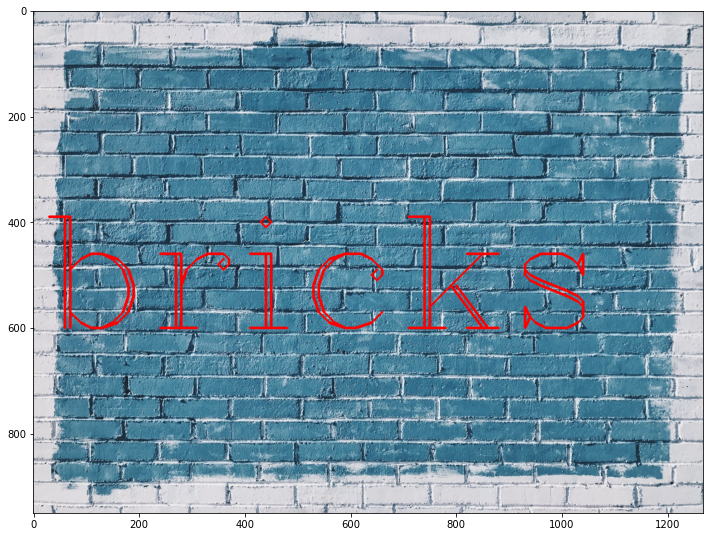

In [74]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img)

In [75]:
#Describing Kernel size
blurred_img = cv2.blur(img,ksize=(5,5))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


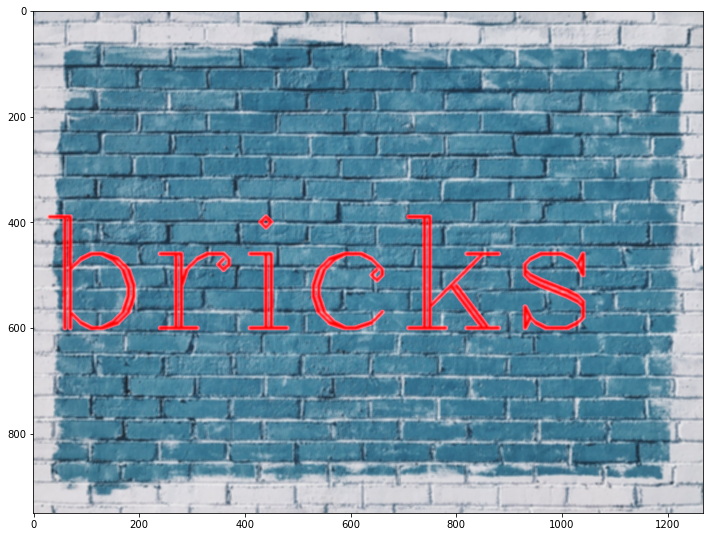

In [76]:
display_img(blurred_img)

### 4. Gausssian Blur

These take a group of values, and then go along to calculate the averages and bring the outputs

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


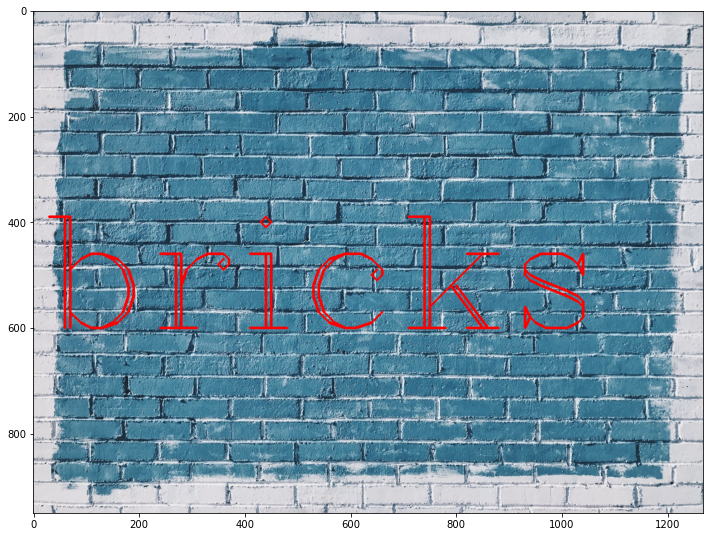

In [77]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


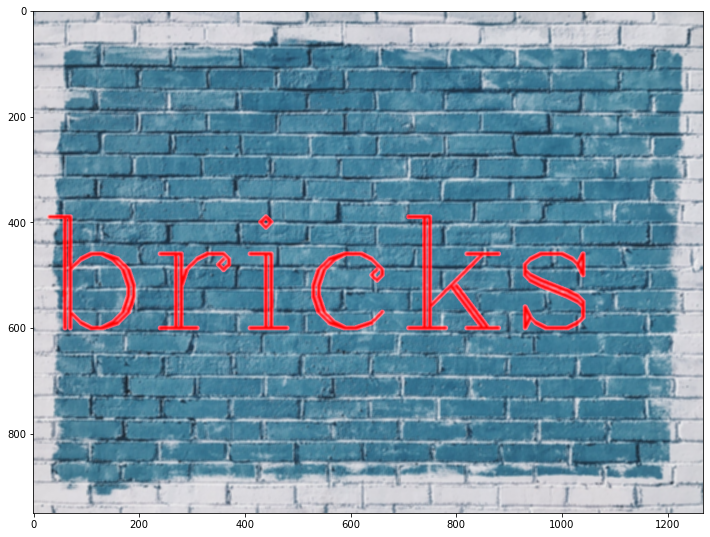

In [78]:
#Providing Kernel size and sigma value
blurred_img = cv2.GaussianBlur(img,(5,5),10)
display_img(blurred_img)

### 5. Median Blurring

It is mostly used in removing noise from an image while trying to keep the details intact. 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


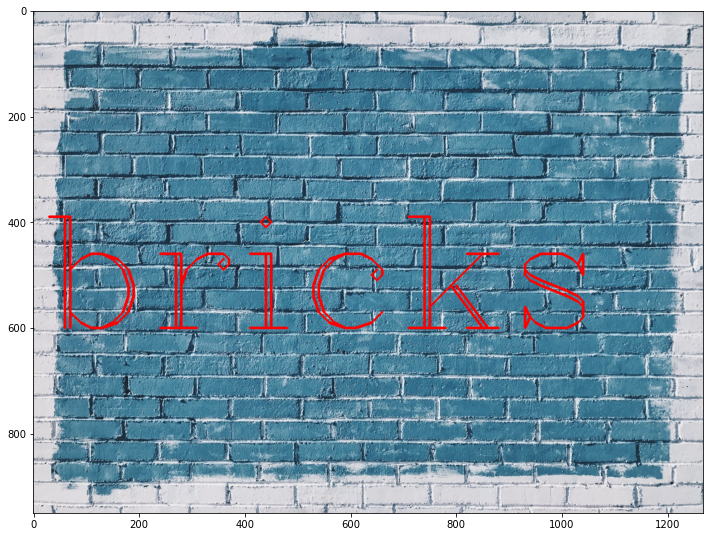

In [79]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


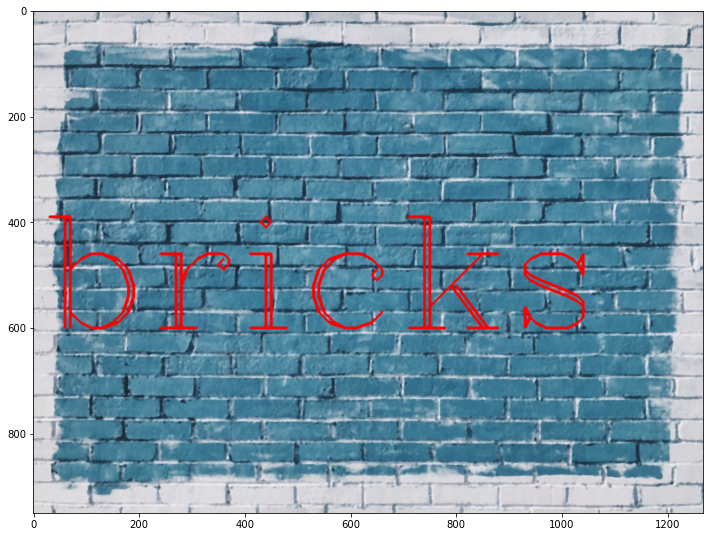

In [80]:
#Takes just a no. signifying the kernel size i.e. 5 = 5 by 5 kernel size
median = cv2.medianBlur(img,5)
display_img(median)

#### Adding Noise to an Image
Useful case of Median Blurring by adding some random noise to an image.

In [81]:
img = cv2.imread('sammy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [82]:
img.max()

255

In [83]:
img.min()

0

In [84]:
img.mean()

89.33240744375256

In [85]:
img.shape

(1367, 1025, 3)

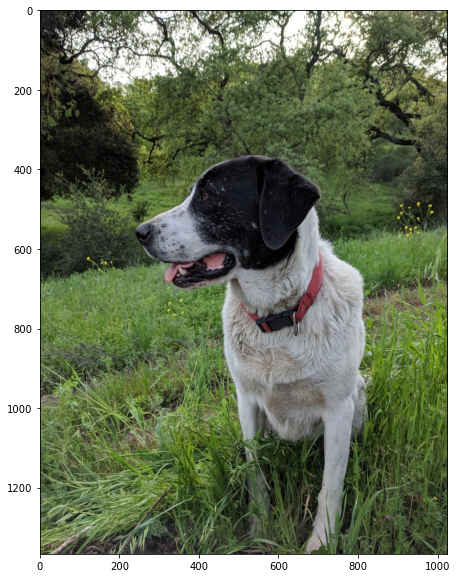

In [86]:
display_img(img)

In [87]:
#Importing Noise image
noise_img = cv2.imread('sammy_noise.jpg')

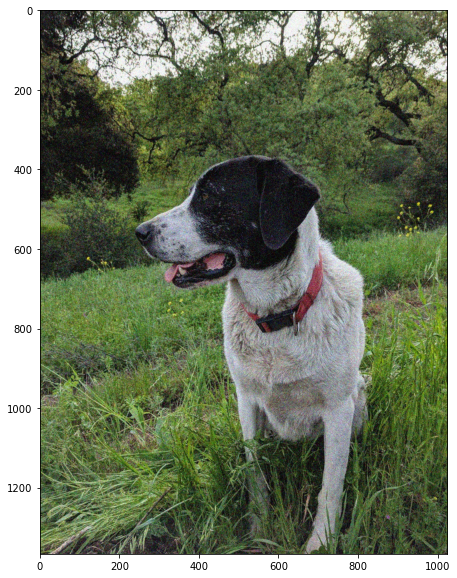

In [88]:
display_img(noise_img)

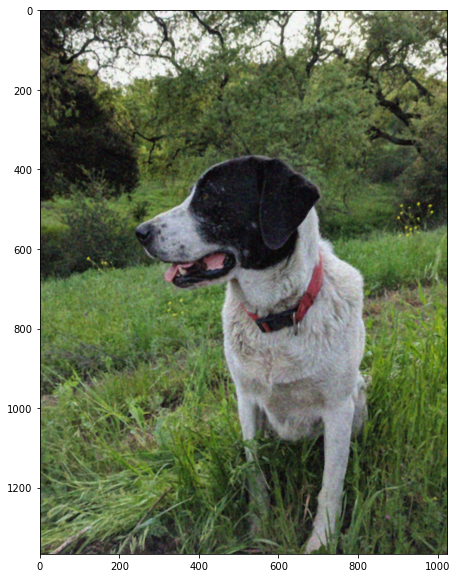

In [89]:
#Using Median Blur to an image (start with 5 by 5 kernel and then move to a higher one)
median = cv2.medianBlur(noise_img,5)
display_img(median)

## 4. Histograms

Matplotlib expects the images in a different RGB ordering vs BGR in OpenCV, so if we use OpenCV to calculate anything channel oriented, we'll want to make sure we keep the original RGB ordering, however if we ever want to display the image, then we'll need to convert to the RGB ordering that matplotlib wants.

In [90]:
#Format of BGR of image
dark_horse = cv2.imread('horse.jpg')
#Converted to RGB to show in matplotlib
show_horse = cv2.cvtColor(dark_horse, cv2.COLOR_BGR2RGB)

rainbow = cv2.imread('rainbow.jpg')
show_rainbow =cv2.cvtColor(rainbow, cv2.COLOR_BGR2RGB)

blue_bricks = cv2.imread('bricks.jpg')
show_bricks = cv2.cvtColor(blue_bricks, cv2.COLOR_BGR2RGB)

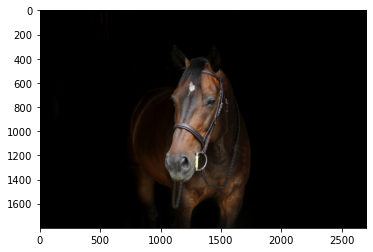

In [91]:
plt.imshow(show_horse)
# 0 value in pixel shows black

In [99]:
show_horse

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[4, 3, 1],
        [4, 3, 1],
        [4, 3, 1],
        ...,
        [2, 1, 0],
        [5, 1, 0],
        [5, 1, 0]],

       [[4, 3, 1],
        [4, 3, 1],
        [4, 3, 1],
        ...,
        [3, 2, 0],
        [6, 2, 0],
        [6, 2, 0]],

       [[4, 3, 1],
        [4, 3, 1],
        [4, 3, 1],
        ...,
        [4, 3, 1],
        [7, 3, 0],
        [7, 3, 0]]], dtype=uint8)

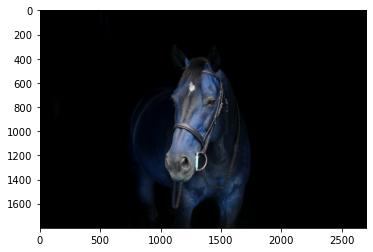

In [93]:
#MATPLOTLIB IMSHOW EXPECTS THE RGB IN A DIFFERENT ORDER!
plt.imshow(dark_horse)

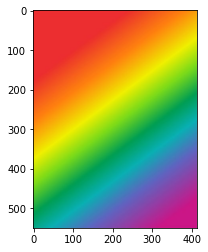

In [94]:
plt.imshow(show_rainbow)

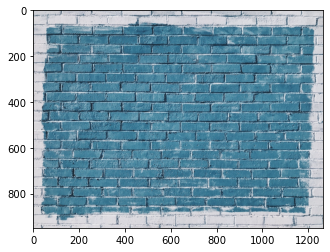

In [95]:
plt.imshow(show_bricks)

### OpenCV Histogram

**cv2.calcHist(images, channels, mask, histSize, ranges[, hist[, accumulate]])**

* images : it is the source image of type uint8 or float32. it should be given in square brackets, ie, “[img]”.
* channels : it is also given in square brackets. It is the index of channel for which we calculate histogram. For example, if input is grayscale image, its value is [0]. For color image, you can pass [0], [1] or [2] to calculate histogram of blue, green or red channel respectively.
* mask : mask image. To find histogram of full image, it is given as “None”. But if you want to find histogram of particular region of image, you have to create a mask image for that and give it as mask.
* histSize : this represents our BIN count. Need to be given in square brackets. For full scale, we pass [256].
* ranges : this is our RANGE. Normally, it is [0,256].

In [96]:
#Histogram on the Original image
hist_values = cv2.calcHist([blue_bricks],channels=[0],mask=None,histSize=[256],ranges=[0,256])

In [97]:
hist_values.shape

(256, 1)

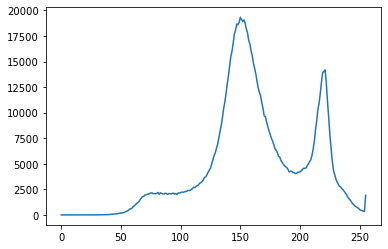

In [98]:
#Histogram for blue image
plt.plot(hist_values)

In [100]:
#For horse image
hist_values = cv2.calcHist([dark_horse],channels=[0],mask=None,histSize=[256],ranges=[0,256])

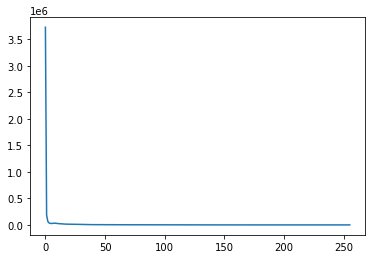

In [101]:
#No blue color in the image
plt.plot(hist_values)

#Most of the blue color in image is 0

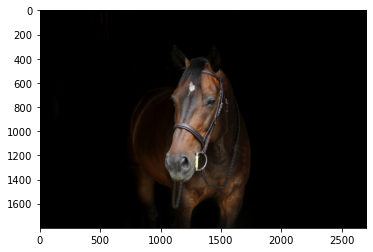

In [102]:
plt.imshow(show_horse)

### Plotting 3 Color Histograms

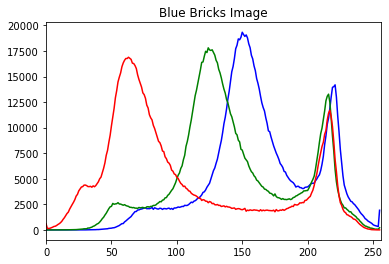

In [103]:
#We can see that mostly blue color is there in image
img = blue_bricks
color = ('b','g','r')
#Index,color value through enumerate
for i,col in enumerate(color):
    histr = cv2.calcHist([img],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.title('Blue Bricks Image')
plt.show()

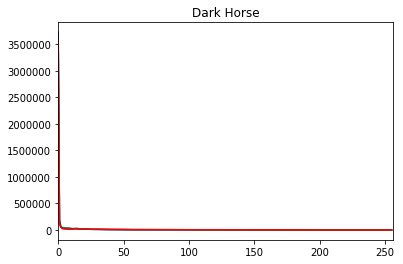

In [44]:
img = dark_horse
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([img],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.title('Dark Horse')
plt.show()

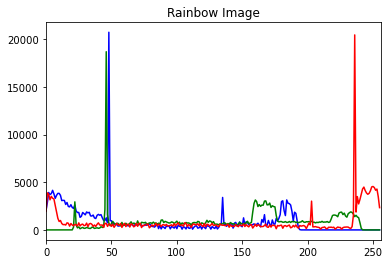

In [104]:
img = rainbow
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([img],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.title('Rainbow Image')
plt.show()

### Histogram Masking

Mask helps to know certain parts of the image.

In [105]:
img = rainbow

In [106]:
img.shape

(550, 413, 3)

In [110]:
# create a mask

#Creating a black background
mask = np.zeros(img.shape[:2], np.uint8)

#Taking the ROI and converting whole to 255 (i.e. white)
mask[300:400, 100:400] = 255

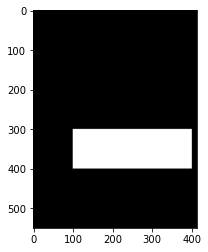

In [111]:
plt.imshow(mask,cmap='gray')

In [112]:
#Performing masking of image
masked_img = cv2.bitwise_and(img,img,mask = mask)

#On RGB color format
show_masked_img = cv2.bitwise_and(show_rainbow,show_rainbow,mask = mask)

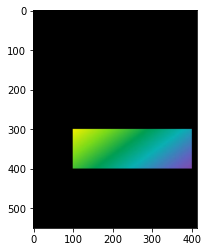

In [113]:
plt.imshow(show_masked_img)

In [114]:
#Applying mask on histogram to just see the required portion of image
#Image in BGR format , channels = 2 signifying red color
hist_mask_values_red = cv2.calcHist([rainbow],channels=[2],mask=mask,histSize=[256],ranges=[0,256])

#Whole image
hist_full_values_red = cv2.calcHist([rainbow],channels=[2],mask=None,histSize=[256],ranges=[0,256])

Text(0.5,1,'Histogram for RED values of the full image')

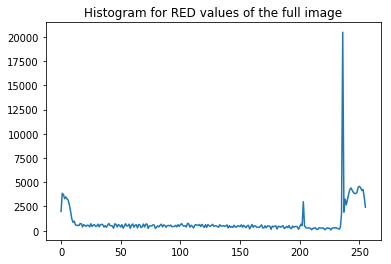

In [79]:
plt.plot(hist_full_values_red)
plt.title('Histogram for RED values of the full image')

#In the full image, we can see that there is some red at the bottom right of image

Text(0.5, 1.0, 'Histogram for RED values for the Masked Area')

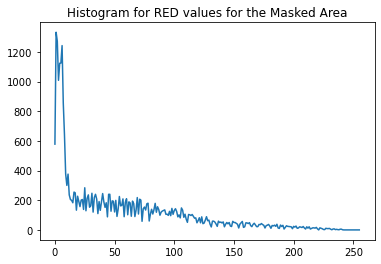

In [115]:
plt.plot(hist_mask_values_red)
plt.title('Histogram for RED values for the Masked Area')

#Can see that there is as such no red color in the masked image

### Histogram Equalization

It is a method of contrast adjustment based on the image's histogram

In [119]:
#Reading as Grayscale
gorilla = cv2.imread('gorilla.jpg',0)

In [120]:
def display(img,cmap=None):
    fig = plt.figure(figsize=(10,8))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap)

#### Single Channel (Grayscale)

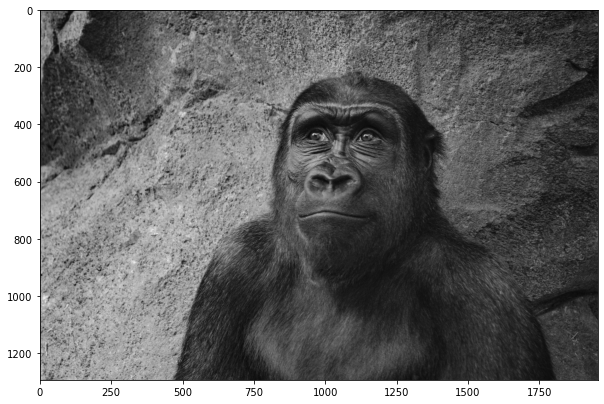

In [121]:
display(gorilla,cmap='gray')

In [100]:
hist_values = cv2.calcHist([gorilla],channels=[0],mask=None,histSize=[256],ranges=[0,256])

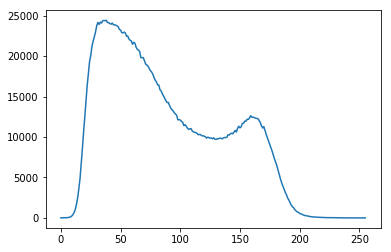

In [101]:
#We can see that mostly the colors are the ligter ones in an image
plt.plot(hist_values)

In [122]:
#Equalizing the gorilla image
eq_gorilla = cv2.equalizeHist(gorilla)

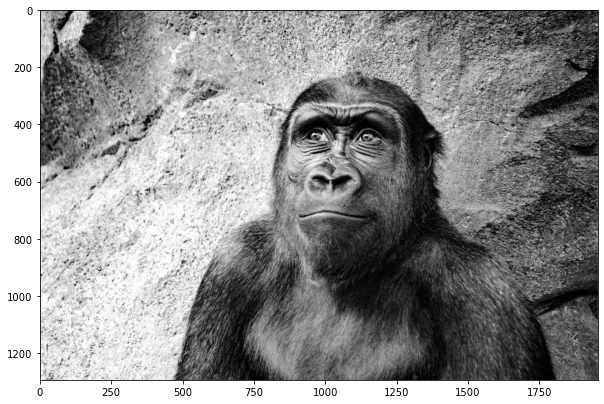

In [123]:
display(eq_gorilla,cmap='gray')

In [124]:
hist_values = cv2.calcHist([eq_gorilla],channels=[0],mask=None,histSize=[256],ranges=[0,256])

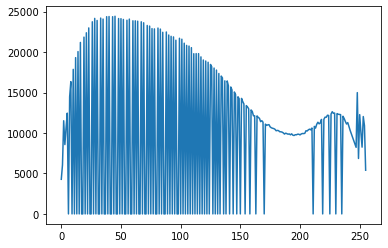

In [125]:
#Effect is higher contrast as compared to the original image
plt.plot(hist_values)

#### Color Images

In [127]:
color_gorilla = cv2.imread('gorilla.jpg')
show_gorilla = cv2.cvtColor(color_gorilla,cv2.COLOR_BGR2RGB)
# Convert to HSV (Hue Staturation Value) colorspace to work on color images
hsv = cv2.cvtColor(color_gorilla, cv2.COLOR_BGR2HSV)

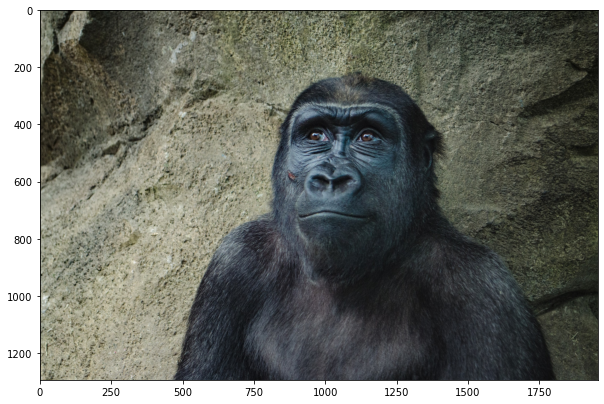

In [128]:
display(show_gorilla)

In [129]:
# Grab V channel
hsv[:,:,2]

array([[127, 121, 115, ...,  43,  42,  42],
       [121, 124, 123, ...,  47,  49,  51],
       [118, 129, 131, ...,  47,  50,  53],
       ...,
       [196, 198, 185, ...,  55,  55,  55],
       [184, 185, 182, ...,  51,  52,  53],
       [174, 170, 173, ...,  49,  50,  50]], dtype=uint8)

In [130]:
#Histogram equalisation of the Value channel
hsv[:,:,2] = cv2.equalizeHist(hsv[:,:,2])

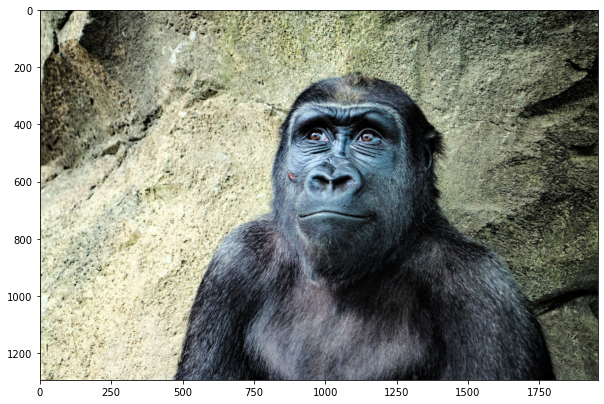

In [131]:
# Convert back to RGB to visualize
eq_color_gorilla = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
display(eq_color_gorilla)